In [1]:
# importing necessary libraries and configurations
import matplotlib.pyplot as plt
import numpy as np 
import pandas as pd

from fbprophet import Prophet
from fbprophet.plot import plot_plotly
from fbprophet.plot import add_changepoints_to_plot

%matplotlib inline

In [2]:
# loading datasets
df = pd.read_csv("df_clean.csv")

In [3]:
# data cleaning and indexing
drop = ["zip_code", "latitude", "longitude"]

df.drop(drop, axis=1, inplace=True)
df.occurred_date = df.occurred_date.astype("datetime64")
df.set_index(["occurred_date"], inplace=True)
df.sort_index(inplace=True)

# examining the overall dataframe
display(df.info())
display(df.head())
display(df.tail())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2296688 entries, 2003-01-01 to 2020-12-26
Data columns (total 14 columns):
 #   Column                       Dtype  
---  ------                       -----  
 0   highest_offense_description  object 
 1   family_violence              object 
 2   report_date_time             object 
 3   location_type                object 
 4   address                      object 
 5   council_district             float64
 6   apd_sector                   object 
 7   apd_district                 object 
 8   clearance_status             object 
 9   clearance_date               object 
 10  year                         int64  
 11  month                        int64  
 12  week                         int64  
 13  day                          int64  
dtypes: float64(1), int64(4), object(9)
memory usage: 262.8+ MB


None

,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,
2003-01-01,BURGLARY OF RESIDENCE,N,2003-09-09 20:10:00,RESIDENCE / HOME,5516 HELEN ST,4.0,ID,6,NaN,2003-09-11 00:00:00,2003,1,1,1
2003-01-01,ASSAULT W/INJURY-FAM/DATE VIOL,N,2003-01-01 06:03:00,RESIDENCE / HOME,3700 MANCHACA RD,5.0,DA,4,O,2003-01-03 00:00:00,2003,1,1,1
2003-01-01,BURGLARY OF VEHICLE,N,2003-01-01 19:26:00,STREETS / HWY / ROAD / ALLEY,4713 FRANKLIN PARK DR,2.0,FR,5,N,NaN,2003,1,1,1
2003-01-01,BURGLARY OF COIN-OP MACHINE,N,2003-01-02 10:22:00,OTHER / UNKNOWN,10009 N LAMAR BLVD,4.0,ED,1,N,NaN,2003,1,1,1
2003-01-01,POSS CONTROLLED SUB/NARCOTIC,N,2003-01-01 23:33:00,STREETS / HWY / ROAD / ALLEY,1400 BLOCK TINNIN FORD RD,3.0,HE,2,C,2003-01-02 00:00:00,2003,1,1,1


,highest_offense_description,family_violence,report_date_time,location_type,address,council_district,apd_sector,apd_district,clearance_status,clearance_date,year,month,week,day
occurred_date,,,,,,,,,,,,,,
2020-12-26,BURGLARY OF VEHICLE,N,2020-12-26 12:33:00,PARKING LOTS / GARAGE,1110 BARTON SPRINGS RD,9.0,DA,1,NaN,NaN,2020,12,52,26
2020-12-26,BURGLARY OF VEHICLE,N,2020-12-26 15:24:00,SPECIALTY STORE (TV FUR ETC.),13376 N US 183 HWY SVRD SB,6.0,AD,6,NaN,NaN,2020,12,52,26
2020-12-26,THEFT,N,2020-12-26 12:13:00,OTHER / UNKNOWN,1201 BARBARA JORDAN BLVD,9.0,BA,4,NaN,NaN,2020,12,52,26
2020-12-26,BURGLARY OF VEHICLE,N,2020-12-26 09:45:00,RESIDENCE / HOME,5906 LONG CT,10.0,BA,8,NaN,NaN,2020,12,52,26
2020-12-26,ASSAULT W/INJURY-FAM/DATE VIOL,Y,2020-12-26 02:06:00,GAS / SERVICE STATIONS,13000 N IH 35 SVRD SB,7.0,ED,4,NaN,NaN,2020,12,52,26


In [4]:
df_viol = df.query(
    'highest_offense_description == ["AGG ASSAULT", "AGG ROBBERY/DEADLY WEAPON", "CAPITAL MURDER", "MURDER", "RAPE"]'
)
df_viol_mur = df.query('highest_offense_description == ["MURDER", "CAPITAL MURDER"]')

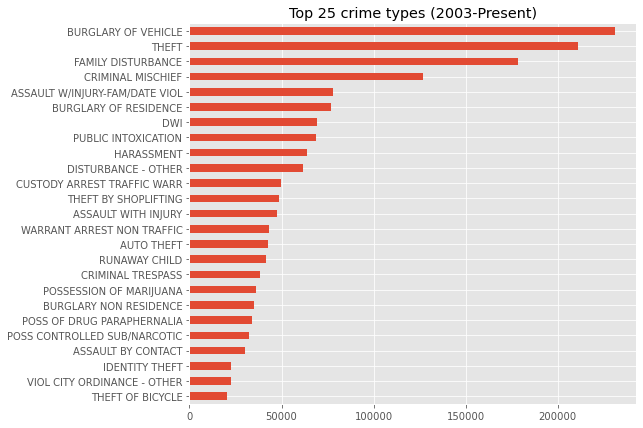

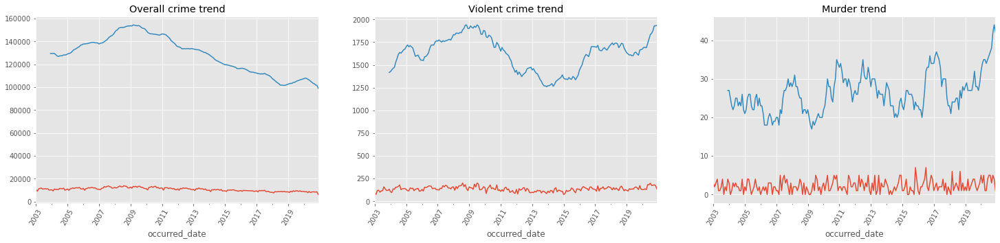

In [5]:
# Top 25 crime types
df.highest_offense_description.value_counts().head(25).sort_values().plot.barh(
    title="Top 25 crime types (2003-Present)", figsize=(8, 7)
)
plt.show()

# Visualizing trends (overall, violent, and murder)
fig, axs = plt.subplots(ncols=3, figsize=(25, 5))
df.resample("M").size().plot(ax=axs[0])
df.resample("M").size().rolling(12).sum().plot(
    title="Overall crime trend", rot=60, ax=axs[0]
)
df_viol.resample("M").size().plot(ax=axs[1])
df_viol.resample("M").size().rolling(12).sum().plot(
    title="Violent crime trend", rot=60, ax=axs[1]
)
df_viol_mur.resample("M").size().plot(ax=axs[2])
df_viol_mur.resample("M").size().rolling(12).sum().plot(
    title="Murder trend", rot=60, ax=axs[2]
)
plt.show()

## Predicting crime rates with Facebook Prophet 

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


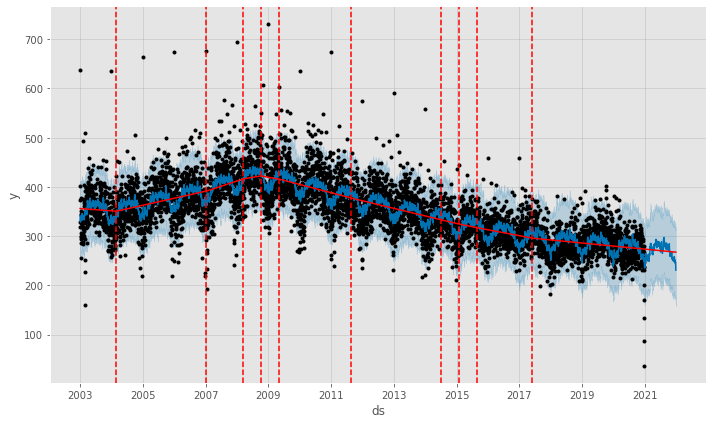

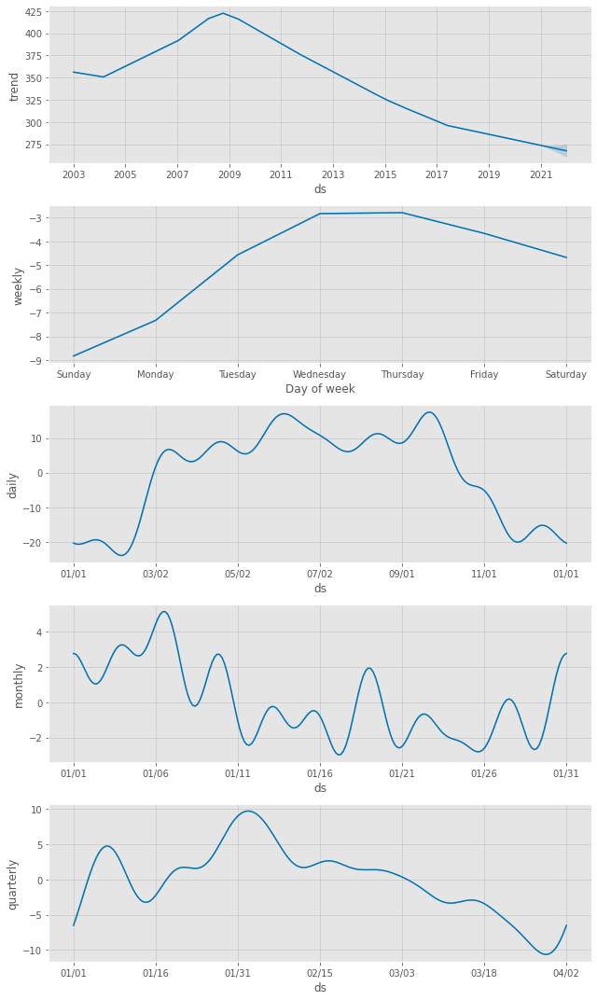

In [6]:
# forecasting for overall crime
df_fbprophet = df

df_m = df_fbprophet.resample("D").size().reset_index()
df_m.columns = ["date", "daily_crime_count"]
df_m_final = df_m.rename(columns={"date": "ds", "daily_crime_count": "y"})

m = Prophet(interval_width=0.95, yearly_seasonality=False)
m.add_seasonality(name="monthly", period=30.5, fourier_order=10)
m.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
m.add_seasonality(name="weekly", period=52, fourier_order=10)
m.add_seasonality(name="daily", period=365, fourier_order=10)
m.fit(df_m_final)

future = m.make_future_dataframe(periods=365, freq="D")

forecast = m.predict(future)

fig = m.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), m, forecast)

fig2 = m.plot_components(forecast)

fig2_1 = plot_plotly(m, forecast)
fig2_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


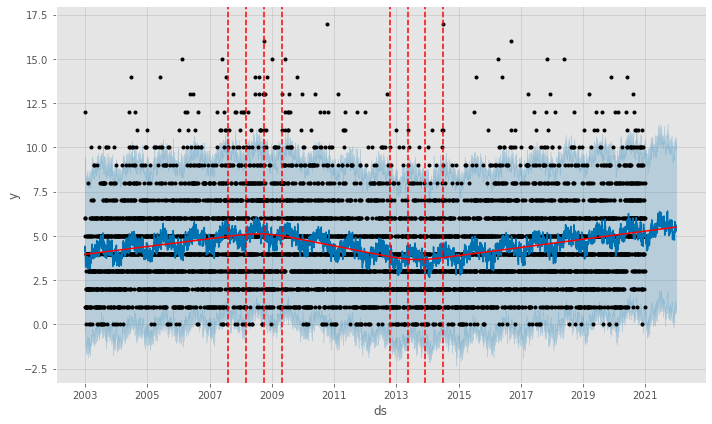

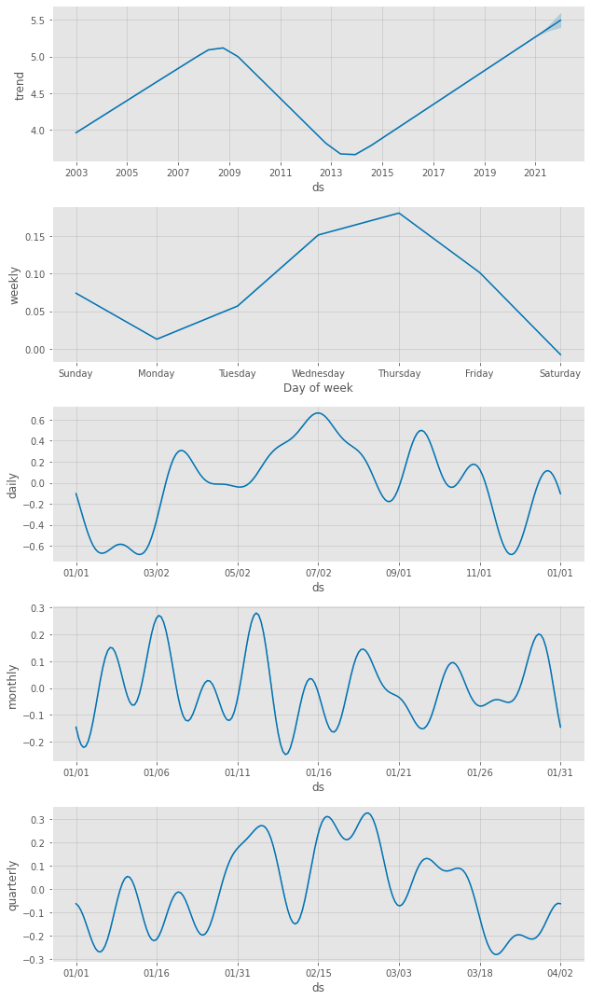

In [7]:
# forecasting for violent crime
df_viol_fbprophet = df_viol

df_viol_n = df_viol_fbprophet.resample("D").size().reset_index()
df_viol_n.columns = ["date", "daily_crime_count"]
df_viol_n_final = df_viol_n.rename(columns={"date": "ds", "daily_crime_count": "y"})

n = Prophet(interval_width=0.95, yearly_seasonality=False)
n.add_seasonality(name="monthly", period=30.5, fourier_order=10)
n.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
n.add_seasonality(name="weekly", period=52, fourier_order=10)
n.add_seasonality(name="daily", period=365, fourier_order=10)
n.fit(df_viol_n_final)

future = n.make_future_dataframe(periods=365, freq="D")
forecast = n.predict(future)

fig = n.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), n, forecast)

fig3 = n.plot_components(forecast)

fig3_1 = plot_plotly(n, forecast)
fig3_1

INFO:fbprophet:Found custom seasonality named 'weekly', disabling built-in 'weekly' seasonality.
INFO:fbprophet:Found custom seasonality named 'daily', disabling built-in 'daily' seasonality.


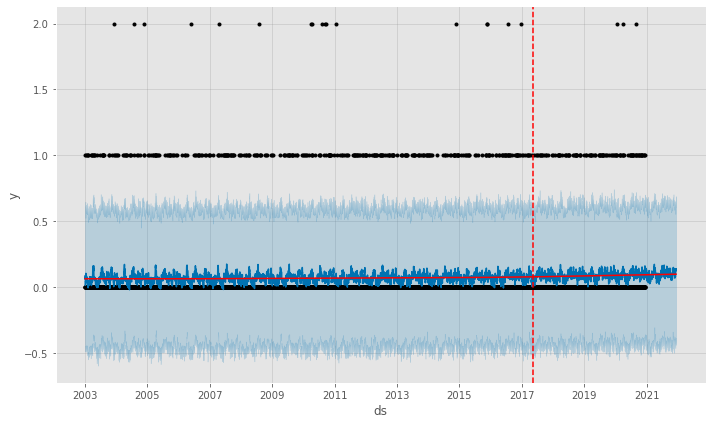

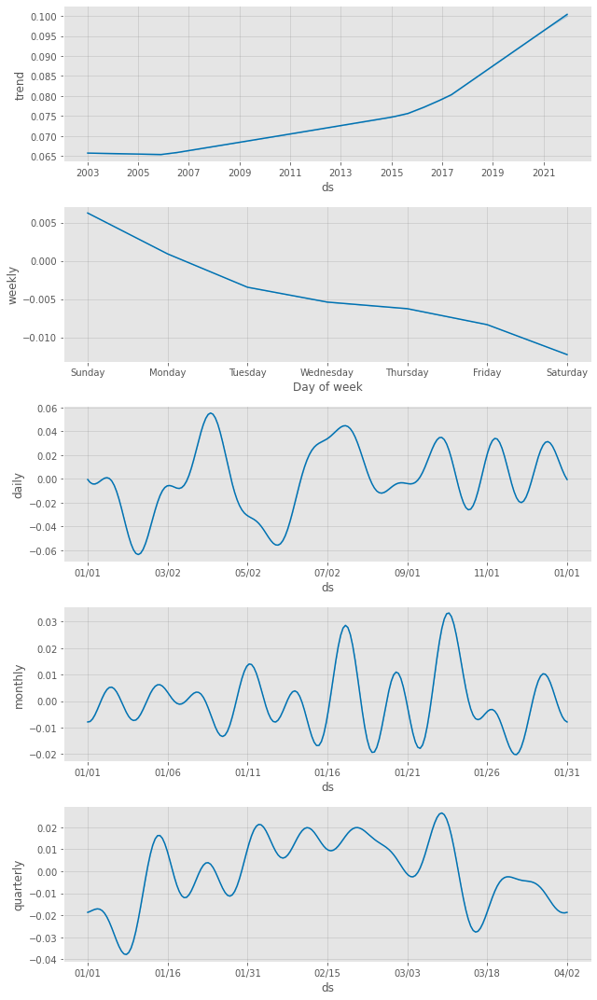

In [8]:
# forecasting for murder rates
df_viol_mur_fbprophet = df_viol_mur

df_viol_mur_o = df_viol_mur_fbprophet.resample("D").size().reset_index()
df_viol_mur_o.columns = ["date", "daily_crime_count"]
df_viol_mur_o_final = df_viol_mur_o.rename(
    columns={"date": "ds", "daily_crime_count": "y"}
)

o = Prophet(interval_width=0.95, yearly_seasonality=False)
o.add_seasonality(name="monthly", period=30.5, fourier_order=10)
o.add_seasonality(name="quarterly", period=91.5, fourier_order=10)
o.add_seasonality(name="weekly", period=52, fourier_order=10)
o.add_seasonality(name="daily", period=365, fourier_order=10)
o.fit(df_viol_mur_o_final)

future = o.make_future_dataframe(periods=365, freq="D")
forecast = o.predict(future)

fig = o.plot(forecast)
a = add_changepoints_to_plot(fig.gca(), o, forecast)

fig4 = o.plot_components(forecast)

fig4_1 = plot_plotly(o, forecast)
fig4_1